# ShAPO: Implicit Representations for Multi-Object Shape, Appearance, and Pose Optimization
    
<img src="https://raw.githubusercontent.com/zubair-irshad/shapo/master/demo/mesh_models.png" width=70% height=auto>

<center>
    
Made by [![Twitter URL](https://img.shields.io/twitter/url/https/twitter.com/zubairirshad.svg?style=social&label=Follow%20%40zubairirshad)](https://twitter.com/mzubairirshad)

Code in [![GitHub stars](https://img.shields.io/github/stars/zubair-irshad/shapo?style=social)](https://github.com/zubair-irshad/shapo)

Page at [![](https://img.shields.io/badge/Project-Page-blue?style=flat&logo=Google%20chrome&logoColor=blue)](https://zubair-irshad.github.io/projects/ShAPO.html)

</center>




In [ ]:
import IPython

IPython.display.HTML('<h2>5-Minute Presentation</h2><iframe width="560" height="315" src="https://www.youtube.com/embed/LMg7NDcLDcA" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>')

### Explore Inference and Optimization of ShAPO: Implicit Representations for Multi-Object Shape, Appearance, and Pose Optimization

This is a colab to explore ShAPO inference and optimization properties, proposed in our work [ShAPO: Implicit Representations for Multi-Object Shape, Appearance, and Pose Optimization](https://zubair-irshad.github.io/projects/ShAPO.html).
#### Make sure that you have enabled the GPU under Runtime-> Change runtime type!


We will then reproduce the following results from the paper:

1. [**Single Shot inference**](#Single-Shot-inference)

    1.1 [Visualize peak and depth output](#Visualize-Peaks-and-Depth-output)
    
    1.2 [Decode shape with predicted textures from shape and appearance embeddings](#Decode-shape-with-predicted-textures-from-shape-and-appearance-embeddings)
    
    1.3 [Project 3D Pointclouds and 3D bounding boxes on 2D image](#Project-3D-Pointclouds-and-3D-bounding-boxes-on-2D-image)
    
    
2. [**Shape, Appearance and Pose Optimization**](#Shape-Appearance-and-Pose-Optimization)

    2.1 [Core optimization loop](Core-optimization-loop)
    
    2.2 [Viusalizing optimized 3D output](Viusalizing-optimized-3D-output)

Let's get started! The whole notebook takes ~5 minutes or so to run.


In [ ]:
#Run this on Google Colab
!git clone https://github.com/zubair-irshad/shapo.git
!pip install --upgrade pip
!cd shapo && pip install -r requirements.txt -f https://download.pytorch.org/whl/torch_stable.html
!pip install torch==1.7.1+cu101 torchvision==0.8.2+cu101 -f https://download.pytorch.org/whl/torch_stable.html
!cd shapo && wget https://www.dropbox.com/s/cvqyhr67zpxyq36/test_subset.tar.xz?dl=1 -O test_subset.tar.xz && tar -xvf test_subset.tar.xz
!cd shapo && wget https://www.dropbox.com/s/929kz7zuxw8jajy/sdf_rgb_pretrained.tar.xz?dl=1 -O sdf_rgb_pretrained.tar.xz && tar -xvf sdf_rgb_pretrained.tar.xz
!cd shapo && wget https://www.dropbox.com/s/nrsl67ir6fml9ro/ckpts.tar.xz?dl=1 -O ckpts.tar.xz && tar -xvf ckpts.tar.xz
!cd shapo && mkdir test_data && mv test_subset/* test_data && mv sdf_rgb_pretrained test_data

^C
^C



KeyboardInterrupt



Could not fetch URL https://pypi.org/simple/pip/: There was a problem confirming the ssl certificate: HTTPSConnectionPool(host='pypi.org', port=443): Max retries exceeded with url: /simple/pip/ (Caused by SSLError(SSLZeroReturnError(6, 'TLS/SSL connection has been closed (EOF) (_ssl.c:1149)'))) - skipping


In [2]:
import os
os.chdir("毕业设计/shapo/...")

# Dependencies

In [15]:
import argparse
import pathlib
import cv2
import numpy as np
import torch
import torch.nn.functional as F
import open3d as o3d
import matplotlib.pyplot as plt
import os
import time
import pytorch_lightning as pl
import _pickle as cPickle
import os, sys
sys.path.append('shapo')
from simnet.lib.net import common
from simnet.lib import camera
from simnet.lib.net.panoptic_trainer import PanopticModel
from utils.nocs_utils import load_img_NOCS, create_input_norm
from utils.viz_utils import depth2inv, viz_inv_depth
from utils.transform_utils import get_gt_pointclouds, transform_coordinates_3d, calculate_2d_projections
from utils.transform_utils import project, get_pc_absposes, transform_pcd_to_canonical
from utils.viz_utils import save_projected_points, draw_bboxes, line_set_mesh, display_gird, draw_geometries, show_projected_points
from sdf_latent_codes.get_surface_pointcloud import get_surface_pointclouds_octgrid_viz, get_surface_pointclouds
from sdf_latent_codes.get_rgb import get_rgbnet, get_rgb_from_rgbnet

# ShAPO Model (Setup)

In [16]:
sys.argv = ['', '@configs/net_config.txt']
parser = argparse.ArgumentParser(fromfile_prefix_chars='@')
common.add_train_args(parser)
app_group = parser.add_argument_group('app')
app_group.add_argument('--app_output', default='inference', type=str)
app_group.add_argument('--result_name', default='shapo_inference', type=str)
app_group.add_argument('--data_dir', default='test_data', type=str)

hparams = parser.parse_args()
min_confidence = 0.50
use_gpu=True
hparams.checkpoint = 'ckpts/shapo_real.ckpt'
model = PanopticModel(hparams, 0, None, None)
model.eval()
if use_gpu:
    model.cuda()
data_path = open(os.path.join(hparams.data_dir, 'Real', 'test_list_subset.txt')).read().splitlines()
_CAMERA = camera.NOCS_Real()
sdf_pretrained_dir = os.path.join(hparams.data_dir, 'sdf_rgb_pretrained')
rgb_model_dir = os.path.join(hparams.data_dir, 'sdf_rgb_pretrained', 'rgb_net_weights')

Using model class from: D:\毕业设计\shapo\simnet\lib\net\models\panoptic_net.py
input_shape ShapeSpec(channels=3, height=480, width=640, stride=None)
Restoring from checkpoint: ckpts/shapo_real.ckpt


# Single Shot inference
 Note that how this part is similar to [CenterSnap](https://zubair-irshad.github.io/projects/CenterSnap.html) and we predict *SDF embeddings* instead of *pointcloud embeddings*. We further predict *appearance embeddings* and *segmentation masks* as well for downstream optimization

In [17]:
#num from 0 to 3 (small subset of data)
num = 0
img_full_path = os.path.join(hparams.data_dir, 'Real', data_path[num])
img_vis = cv2.imread(img_full_path + '_color.png')

left_linear, depth, actual_depth = load_img_NOCS(img_full_path + '_color.png' , img_full_path + '_depth.png')
input = create_input_norm(left_linear, depth)[None, :, :, :]

if use_gpu:
    input = input.to(torch.device('cuda:0'))

with torch.no_grad():
    seg_output, _, _ , pose_output = model.forward(input)
    _, _, _ , pose_output = model.forward(input)
    shape_emb_outputs, appearance_emb_outputs, abs_pose_outputs, peak_output, scores_out, output_indices = pose_output.compute_shape_pose_and_appearance(min_confidence,is_target = False)

### Visualize Peaks and Depth output

(480, 640, 3)


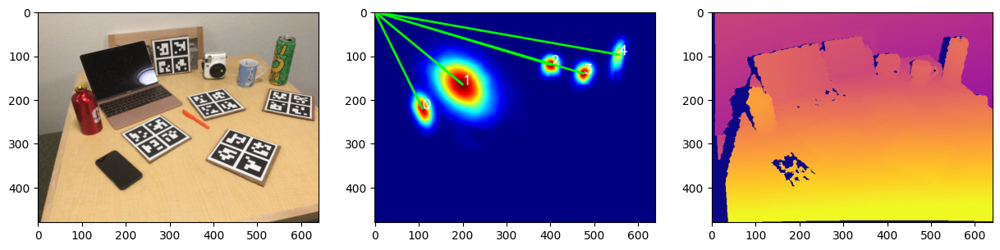

In [18]:
display_gird(img_vis, depth, peak_output)

## Decode shape with predicted textures from shape and appearance embeddings



**Note:** The expected output here is colored pointclouds. Although our shape representation is implicit (i.e. SDF), we only output pointclouds here for computational reasons (i.e. marching cubes output would take some time). If you are interested in getting a mesh, please see save_mesh function in `save_canonical_mesh.py`.

`Click on orbital rotation on the top right side to move the colored pointclouds smoothly.`

**Note:** The shape and pose predictions are really good from the single-shot prediction whereas you'll see appearance embeddings doesn't seem to be there yet. Hence we will perform optimization giving a single-view RGB-D. Please see **4.**

In [19]:
rotated_pcds = []
points_2d = []
box_obb = []
axes = []
lod = 7 # Choose from LOD 3-7 here, going higher means more memory and finer details

# Here we visualize the output of our network
for j in range(len(shape_emb_outputs)):
    shape_emb = shape_emb_outputs[j]
    # appearance_emb = appearance_emb_putputs[j]
    appearance_emb = appearance_emb_outputs[j]
    is_oct_grid = True
    if is_oct_grid:
        # pcd_dsdf_actual = get_surface_pointclouds_octgrid_sparse(shape_emb, sdf_latent_code_dir = sdf_pretrained_dir, lods=[2,3,4,5,6])
        pcd_dsdf, nrm_dsdf = get_surface_pointclouds_octgrid_viz(shape_emb, lod=lod, sdf_latent_code_dir=sdf_pretrained_dir)
    else:
        pcd_dsdf = get_surface_pointclouds(shape_emb)
    rgbnet = get_rgbnet(rgb_model_dir)
    pred_rgb = get_rgb_from_rgbnet(shape_emb, pcd_dsdf, appearance_emb, rgbnet)
    rotated_pc, rotated_box, _ = get_pc_absposes(abs_pose_outputs[j], pcd_dsdf)
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(np.copy(rotated_pc))
    pcd.colors = o3d.utility.Vector3dVector(pred_rgb.detach().cpu().numpy())
    pcd.normals = o3d.utility.Vector3dVector(nrm_dsdf)
    rotated_pcds.append(pcd)

    cylinder_segments = line_set_mesh(rotated_box)
    # draw 3D bounding boxes around the object
    for k in range(len(cylinder_segments)):
      rotated_pcds.append(cylinder_segments[k])

    # draw 3D coordinate frames around each object
    mesh_frame = o3d.geometry.TriangleMesh.create_coordinate_frame(size=0.1, origin=[0, 0, 0])
    T = abs_pose_outputs[j].camera_T_object
    mesh_t = mesh_frame.transform(T)
    rotated_pcds.append(mesh_t)

    points_mesh = camera.convert_points_to_homopoints(rotated_pc.T)
    points_2d.append(project(_CAMERA.K_matrix, points_mesh).T)
    #2D output
    points_obb = camera.convert_points_to_homopoints(np.array(rotated_box).T)
    box_obb.append(project(_CAMERA.K_matrix, points_obb).T)
    xyz_axis = 0.3*np.array([[0, 0, 0], [0, 0, 1], [0, 1, 0], [1, 0, 0]]).transpose()
    sRT = abs_pose_outputs[j].camera_T_object @ abs_pose_outputs[j].scale_matrix
    transformed_axes = transform_coordinates_3d(xyz_axis, sRT)
    axes.append(calculate_2d_projections(transformed_axes, _CAMERA.K_matrix[:3,:3]))
draw_geometries(rotated_pcds)

## Project 3D Pointclouds and 3D bounding boxes on 2D image

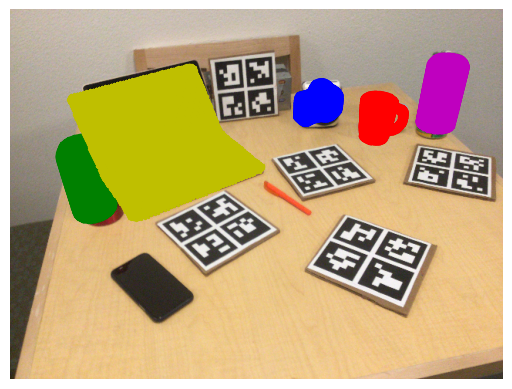

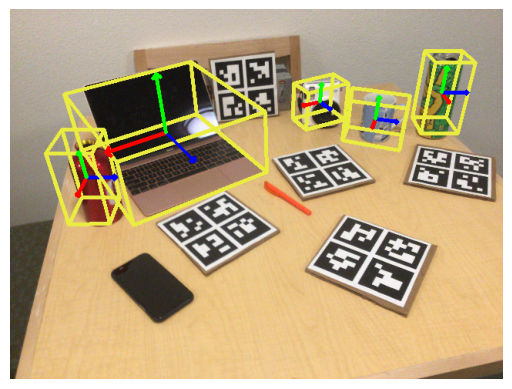

In [20]:
color_img = np.copy(img_vis)
projected_points_img = show_projected_points(color_img, points_2d)
colors_box = [(63, 237, 234)]
im = np.array(np.copy(img_vis)).copy()
for k in range(len(colors_box)):
    for points_2d, axis in zip(box_obb, axes):
        points_2d = np.array(points_2d)
        im = draw_bboxes(im, points_2d, axis, colors_box[k])

plt.gca().invert_yaxis()
plt.axis('off')
plt.imshow(im[...,::-1])
plt.show()

# Shape Appearance and Pose Optimization

Here we run the core optimization loop i.e. update the shape, appearance latent codes as well as absolute poses to fit the single-view test-time RGB-D observation better

In [21]:
# First define some params for optim and import relevant functions
from sdf_latent_codes.get_surface_pointcloud import get_sdfnet
from sdf_latent_codes.get_rgb import get_rgbnet
from utils.transform_utils import get_abs_pose_vector_from_matrix, get_abs_pose_from_vector
from utils.nocs_utils import get_masks_out, get_aligned_masks_segout, get_masked_textured_pointclouds
from opt.optimization_all import Optimizer

optimization_out = {}
latent_opt = []
RT_opt = []
scale_opt = []

do_optim = True
latent_opt = []
RT_opt = []
scale_opt = []
appearance_opt = []
colored_opt_pcds = []
colored_opt_meshes = []
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
psi, theta, phi, t = (0, 0, 0, 0)
shape_latent_noise = np.random.normal(loc=0, scale=0.02, size=64)
add_noise = False
viz_type = None

# get masks and masked pointclouds of each object in the image
depth_ = np.array(depth, dtype=np.float32)*255.0
seg_output.convert_to_numpy_from_torch()
masks_out = get_masks_out(seg_output, depth_)
masks_out = get_aligned_masks_segout(masks_out, output_indices, depth_)
masked_pointclouds, areas, masked_rgb = get_masked_textured_pointclouds(masks_out, depth_, left_linear[:,:,::-1], camera = _CAMERA)


In [22]:
#helper function to draw textured shape with absolute pose after optimization loop
def draw_colored_shape(emb, abs_pose, appearance_emb, rgbnet, sdf_latent_code_dir, is_oct_grid= False):
    if is_oct_grid:
        lod = 7
        pcd_dsdf, nrm_dsdf = get_surface_pointclouds_octgrid_viz(emb, lod=lod, sdf_latent_code_dir = sdf_latent_code_dir)
    else:
        pcd_dsdf = get_surface_pointclouds(emb)

    pred_rgb = get_rgb_from_rgbnet(emb, pcd_dsdf, appearance_emb, rgbnet)
    #pred_rgb = get_rgb(emb, pcd_dsdf, appearance_emb)

    rotated_pc, rotated_box, _ = get_pc_absposes(abs_pose, pcd_dsdf)
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(np.copy(rotated_pc))
    pcd.colors = o3d.utility.Vector3dVector(pred_rgb.detach().cpu().numpy())
    pcd.normals = o3d.utility.Vector3dVector(nrm_dsdf)
    return pcd

## Core optimization loop

This script will take a couple of minutes to run per image. Note that you can playaround with optimization parameters for best speed/accuracy trade-off i.e. setting a lower LoD or setting number of optimization steps to 100 would suffice in most cases

In [23]:
#Core optimization loop
for k in range(len(shape_emb_outputs)):
  print("Starting optimization, object:", k, "\n", "----------------------------", "\n")
  if viz_type is not None:
      optim_foldername = str(output_path) + '/optim_images_'+str(k)
      if not os.path.exists(optim_foldername):
          os.makedirs(optim_foldername)
  else:
    optim_foldername = None

  #optimization starts here:
  abs_pose = abs_pose_outputs[k]
  mask_area = areas[k]
  RT, s = get_abs_pose_vector_from_matrix(abs_pose.camera_T_object, abs_pose.scale_matrix, add_noise = False)

  if masked_pointclouds[k] is not None:
    shape_emb = shape_emb_outputs[k]
    appearance_emb = appearance_emb_outputs[k]
    decoder = get_sdfnet(sdf_latent_code_dir = sdf_pretrained_dir)
    rgbnet = get_rgbnet(rgb_model_dir)
    params = {}
    weights = {}

    if add_noise:
      shape_emb += shape_latent_noise

    #Set latent vectors/abs pose to optimize here
    params['latent'] = shape_emb
    params['RT'] = RT
    params['scale'] = np.array(s)
    params['appearance'] = appearance_emb
    weights['3d'] = 1

    optimizer = Optimizer(params, rgbnet, device, weights, mask_area)
    # Optimize the initial pose estimate
    iters_optim = 200
    optimizer.optimize_oct_grid(
        iters_optim,
        masked_pointclouds[k],
        masked_rgb[k],
        decoder,
        rgbnet,
        optim_foldername,
        viz_type=viz_type
    )

    #save latent vectors after optimization
    latent_opt.append(params['latent'].detach().cpu().numpy())
    RT_opt.append(params['RT'].detach().cpu().numpy())
    scale_opt.append(params['scale'].detach().cpu().numpy())
    appearance_opt.append(params['appearance'].detach().cpu().numpy())
    abs_pose = get_abs_pose_from_vector(params['RT'].detach().cpu().numpy(), params['scale'].detach().cpu().numpy())
    obj_colored = draw_colored_shape(params['latent'].detach().cpu().numpy(), abs_pose, params['appearance'].detach().cpu().numpy(), rgbnet, sdf_pretrained_dir, is_oct_grid=True)
    colored_opt_pcds.append(obj_colored)
  else:
    latent_opt.append(shape_emb_outputs[k])
    RT_opt.append(RT)
    scale_opt.append(np.array(s))
    appearance_opt.append(appearance_emb_outputs[k])
    print("Done with optimization, object:", k, "\n", "----------------------------", "\n")

Starting optimization, object: 0 
 ---------------------------- 



AttributeError: module 'torch.linalg' has no attribute 'inv'

## Viusalizing optimized 3D output

Finally we visualize the optimized 3D shape, appearance and poses. Notice the difference from regressed output specially appearance

In [ ]:
draw_geometries(colored_opt_pcds)